# Exploratory Data Analysis

- Goal is to get more familiar with the data

# Read Data from Postgres

In [215]:
import os
import psycopg2
import pandas as pd
from dotenv import load_dotenv
import numpy as np
import plotly.graph_objects as go # for candlestick chart
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import sys
import os

# Load environment variables from .env file
load_dotenv()

# Database configuration from environment variables
db_config = {
    "host": os.getenv("DB_HOST"),
    "port": os.getenv("DB_PORT"),
    "user": os.getenv("DB_USER"),
    "password": os.getenv("DB_PASSWORD"),
    "dbname": os.getenv("DB_NAME")
}

def read_data(table_name):
    """
    Read data from the specified PostgreSQL table and return it as a DataFrame.
    """
    try:
        # Connect to the PostgreSQL database
        conn = psycopg2.connect(**db_config)
        
        # Create a cursor object
        cursor = conn.cursor()
        
        # Execute a query to fetch data
        query = f"SELECT * FROM {table_name};"
        cursor.execute(query)
        
        # Fetch all rows from the executed query
        rows = cursor.fetchall()
        
        # Convert the data to a Pandas DataFrame
        columns = [desc[0] for desc in cursor.description]  # Get column names
        df = pd.DataFrame(rows, columns=columns)
        
        # Convert the 'date' column to datetime
        df['date'] = pd.to_datetime(df['date'], errors='coerce')  # Convert to datetime
        
        return df  # Return the DataFrame
        
    except Exception as e:
        print(f"Error reading data from PostgreSQL: {e}")
        return None  # Return None in case of an error
    finally:
        if conn:
            cursor.close()
            conn.close()

# Call the function to read data from the specified table and assign it to df
df = read_data("historical_stock_data")

# Now df is defined and can be used outside the function
if df is None:
    print("No data was retrieved.")

In [216]:
df.dtypes

date          datetime64[ns]
open                 float64
high                 float64
low                  float64
close                float64
adj_close            float64
volume                 int64
stock_name            object
dtype: object

In [217]:
df.head()

,date,open,high,low,close,adj_close,volume,stock_name
0,2010-01-04,7.622500,7.660714,7.585000,7.643214,6.447411,493729600,AAPL
1,2010-01-05,7.664286,7.699643,7.616071,7.656429,6.458557,601904800,AAPL
2,2010-01-06,7.656429,7.686786,7.526786,7.534643,6.355827,552160000,AAPL
3,2010-01-07,7.562500,7.571429,7.466071,7.520714,6.344076,477131200,AAPL
4,2010-01-08,7.510714,7.571429,7.466429,7.570714,6.386256,447610800,AAPL


In [218]:
df = df.sort_values(by='date').reset_index(drop=True)
df.head()

,date,open,high,low,close,adj_close,volume,stock_name
0,2010-01-04,7.622500,7.660714,7.585000,7.643214,6.447411,493729600,AAPL
1,2010-01-04,30.620001,31.100000,30.590000,30.950001,23.347317,38409100,MSFT
2,2010-01-04,1.830000,1.890000,1.801000,1.886000,1.340568,5387000,AVGO
3,2010-01-04,6.812500,6.830500,6.657000,6.695000,6.695000,151998000,AMZN
4,2010-01-04,1116.560059,1133.869995,1116.560059,1132.989990,1132.989990,3991400000,^GSPC


### Divide and Process ^IXIC
* After fetching ^IXIC data, we calculated index return then added to data
* Purpose of this operation is to ensure a daily benchmark for Nasdaq composite performance

In [219]:
nasdaq_data = df[df['stock_name'] == '^IXIC']
nasdaq_data = nasdaq_data[['date', 'adj_close']]
nasdaq_data['nasdaq_return'] = nasdaq_data['adj_close'].pct_change() * 100
nasdaq_data['date'] = pd.to_datetime(nasdaq_data['date'])
nasdaq_data = nasdaq_data[['date' ,'nasdaq_return']]

df['date'] = pd.to_datetime(df['date'])
data = df.sort_values(by='date').reset_index(drop=True)
data = df[df['stock_name'] != '^IXIC']
df = pd.merge(data, nasdaq_data, on='date', how='left')

# Initial EDA

In [220]:
print(df.shape)
df.info()

(33235, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33235 entries, 0 to 33234
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           33235 non-null  datetime64[ns]
 1   open           33235 non-null  float64       
 2   high           33235 non-null  float64       
 3   low            33235 non-null  float64       
 4   close          33235 non-null  float64       
 5   adj_close      33235 non-null  float64       
 6   volume         33235 non-null  int64         
 7   stock_name     33235 non-null  object        
 8   nasdaq_return  33227 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(1), object(1)
memory usage: 2.3+ MB


In [221]:
unique_tickers = df['stock_name'].unique()  # Get unique tickers

for ticker in unique_tickers:
    print(f"Descriptive statistics for {ticker}:")
    ticker_data = df[df['stock_name'] == ticker]  # Filter data for the current ticker
    print(ticker_data.describe())  # Print descriptive statistics
    print("\n")  # Add a newline for better readability

Descriptive statistics for AAPL:
                                date         open         high          low  \
count                           3773  3773.000000  3773.000000  3773.000000   
mean   2017-07-01 04:17:14.296315648    69.655432    70.388103    68.965192   
min              2010-01-04 00:00:00     6.870357     7.000000     6.794643   
25%              2013-10-02 00:00:00    20.516430    20.655714    20.341070   
50%              2017-06-30 00:00:00    37.567501    37.957500    37.290001   
75%              2021-03-31 00:00:00   128.949997   130.600006   127.410004   
max              2024-12-30 00:00:00   258.190002   260.100006   257.630005   
std                              NaN    65.161378    65.849945    64.544108   

             close    adj_close        volume  nasdaq_return  
count  3773.000000  3773.000000  3.773000e+03    3772.000000  
mean     69.712600    67.547473  2.299705e+08       0.064730  
min       6.858929     5.785830  2.323470e+07     -12.321331  
25%

In [222]:
df.head()

,date,open,high,low,close,adj_close,volume,stock_name,nasdaq_return
0,2010-01-04,7.622500,7.660714,7.585000,7.643214,6.447411,493729600,AAPL,NaN
1,2010-01-04,30.620001,31.100000,30.590000,30.950001,23.347317,38409100,MSFT,NaN
2,2010-01-04,1.830000,1.890000,1.801000,1.886000,1.340568,5387000,AVGO,NaN
3,2010-01-04,6.812500,6.830500,6.657000,6.695000,6.695000,151998000,AMZN,NaN
4,2010-01-04,1116.560059,1133.869995,1116.560059,1132.989990,1132.989990,3991400000,^GSPC,NaN


In [223]:
df.duplicated().sum()

0

- No duplicates
- Only 5 days of missing data on 'nasdaq_return'

## Candlesticks

* Candlesticks are common graphs to monitor stock movements

In [224]:
# Create subplots for each symbol
symbols = df['stock_name'].unique()
n_symbols = len(symbols)

# Create figure with subplots
fig = go.Figure()

# Add candlestick traces for each symbol
for symbol in symbols:
    df_symbol = df[df['stock_name'] == symbol].copy()
    candlestick = go.Candlestick(
        x=df_symbol['date'],
        open=df_symbol['open'],
        high=df_symbol['high'],
        low=df_symbol['low'],
        close=df_symbol['adj_close'],
        name=symbol,
        visible=False  # Initially hide all traces
    )
    fig.add_trace(candlestick)

# Make the first trace visible
fig.data[0].visible = True

# Create buttons for each symbol
buttons = []
for i, symbol in enumerate(symbols):
    button = dict(
        label=symbol,
        method="update",
        args=[{"visible": [idx == i for idx in range(n_symbols)]},
              {"title": f"{symbol} Candlestick Chart"}]
    )
    buttons.append(button)

# Update layout
fig.update_layout(
    updatemenus=[{
        'buttons': buttons,
        'direction': 'down',
        'showactive': True,
        'x': 0.1,
        'y': 1.1,
    }],
    title='Stock Candlestick Charts',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Price', rangemode='normal'),
    xaxis_rangeslider_visible=False
)

fig.show()

* Our set of stocks are heavily tech related
* It is important to note that prices are not stationary. 
* Their mean and variance changes over time. This leads to misunderstanding about data. 


## Return

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\1180545391.py:23: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



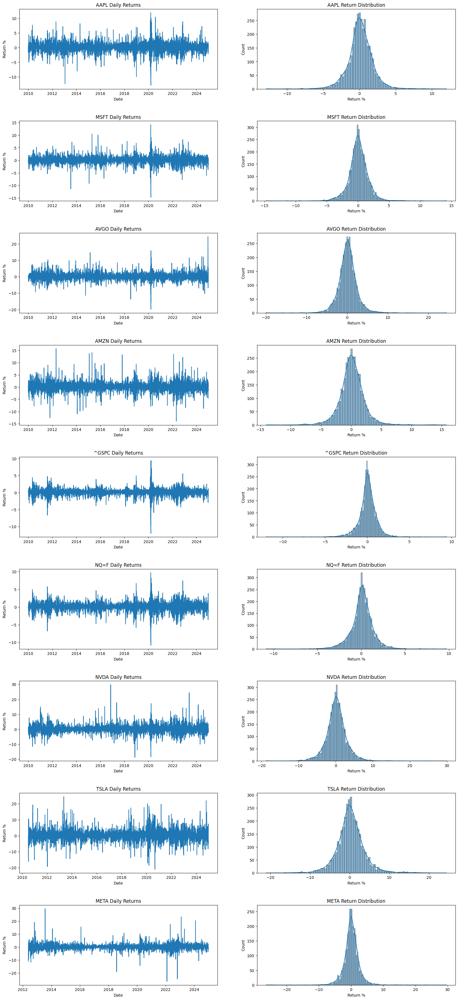

In [225]:
df['daily_return'] = df.groupby('stock_name')['adj_close'].pct_change() * 100  # Daily return in percentage

# Create a figure with subplots for each symbol
fig = plt.figure(figsize=(20, len(symbols)*5))
gs = fig.add_gridspec(len(symbols), 2, hspace=0.4)

for i, symbol in enumerate(symbols):
    df_symbol = df[df['stock_name'] == symbol].copy()
    df_symbol.set_index("date", inplace=True)
    # Time series plot
    ax1 = fig.add_subplot(gs[i, 0])
    ax1.plot(df_symbol.index, df_symbol['daily_return'])
    ax1.set_title(f'{symbol} Daily Returns')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Return %')
    
    # Distribution plot
    ax2 = fig.add_subplot(gs[i, 1])
    sns.histplot(data=df_symbol['daily_return'].dropna(), kde=True, ax=ax2)
    ax2.set_title(f'{symbol} Return Distribution')
    ax2.set_xlabel('Return %')
    
plt.tight_layout()
plt.show()

- Almost all stocks have huge outliers(tails) that will disturb model
- Also, that's why returns are not totally stationary.
- Return distributions are close to normal
- While single huge outliers can be explained by some important event, that affects very badly or otherwise, COVID affected times are not stable

In [226]:
df['daily_return'].describe()

count    33226.000000
mean         0.125626
std          2.242331
min        -26.390098
25%         -0.828633
50%          0.099080
75%          1.082892
max         29.806703
Name: daily_return, dtype: float64

- mean 1.2% return with maximum 29.8% and min -26.4% 
- high std/mean refers to low signal-noise ratio

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\2463825626.py:23: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



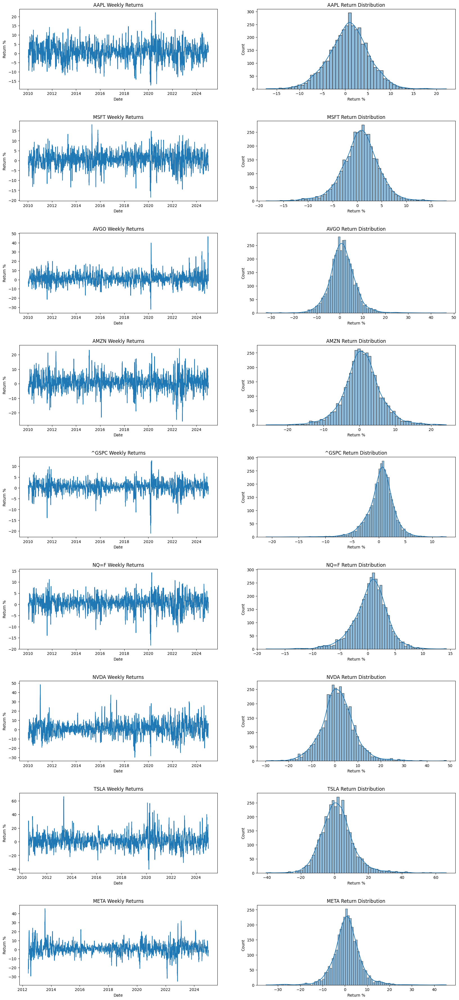

In [227]:
df['weekly_return'] = df.groupby('stock_name')['adj_close'].pct_change(periods=7) * 100  # Daily return in percentage

# Create a figure with subplots for each symbol
fig = plt.figure(figsize=(20, len(symbols)*5))
gs = fig.add_gridspec(len(symbols), 2, hspace=0.4)

for i, symbol in enumerate(symbols):
    df_symbol = df[df['stock_name'] == symbol].copy()
    df_symbol.set_index("date", inplace=True)
    # Time series plot
    ax1 = fig.add_subplot(gs[i, 0])
    ax1.plot(df_symbol.index, df_symbol['weekly_return'])
    ax1.set_title(f'{symbol} Weekly Returns')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Return %')
    
    # Distribution plot
    ax2 = fig.add_subplot(gs[i, 1])
    sns.histplot(data=df_symbol['weekly_return'].dropna(), kde=True, ax=ax2)
    ax2.set_title(f'{symbol} Return Distribution')
    ax2.set_xlabel('Return %')
    
plt.tight_layout()
plt.show()

In [228]:
df['weekly_return'].describe()

count    33172.000000
mean         0.881690
std          5.785422
min        -40.588815
25%         -1.927969
50%          0.792129
75%          3.473277
max         66.186265
Name: weekly_return, dtype: float64

- high std with mean 0.117
- std/mean ratio is higher than daily returns
- to compare both fairly we should resample data weekly.

In [229]:
df['Date'] = pd.to_datetime(df['date'])
df.set_index('Date', inplace=True)

In [230]:
# Resample by stock_name
def resample_stock(group):
    return group.resample('W').agg({
        'open': 'first',           # First value of the week
        'high': 'max',             # Highest value of the week
        'low': 'min',              # Lowest value of the week
        'close': 'last',           # Last value of the week
        'adj_close' : 'last',
        'volume': 'sum',           # Total volume of the week
    })

# Apply resampling to each stock group
weekly_df = df.groupby('stock_name').apply(resample_stock)

weekly_df.reset_index(level=0, inplace=True)
weekly_df.reset_index(inplace=True)
weekly_df = weekly_df.sort_values(by='Date')
weekly_df.head()

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\2453784332.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,Date,stock_name,open,high,low,close,adj_close,volume
0,2010-01-10,AAPL,7.622500,7.699643,7.466071,7.570714,6.386256,2572536400
6116,2010-01-10,^GSPC,1116.560059,1145.390015,1116.560059,1144.979980,1144.979980,21115350000
1566,2010-01-10,AVGO,1.830000,1.930000,1.801000,1.917000,1.362603,19346000
4575,2010-01-10,NVDA,0.462750,0.474000,0.452750,0.463750,0.425298,3203980000
3009,2010-01-10,MSFT,30.620001,31.100000,30.190001,30.660000,23.128557,248098200


In [231]:
weekly_df['weekly_return'] = weekly_df.groupby('stock_name')['adj_close'].pct_change()
weekly_df['weekly_return'].describe()

count    6890.000000
mean        0.005994
std         0.047388
min        -0.258613
25%        -0.017955
50%         0.005020
75%         0.027401
max         0.407149
Name: weekly_return, dtype: float64

- whether we decide regression or classification, using weekly data might help to get better results

## Price Difference

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\3909884094.py:23: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



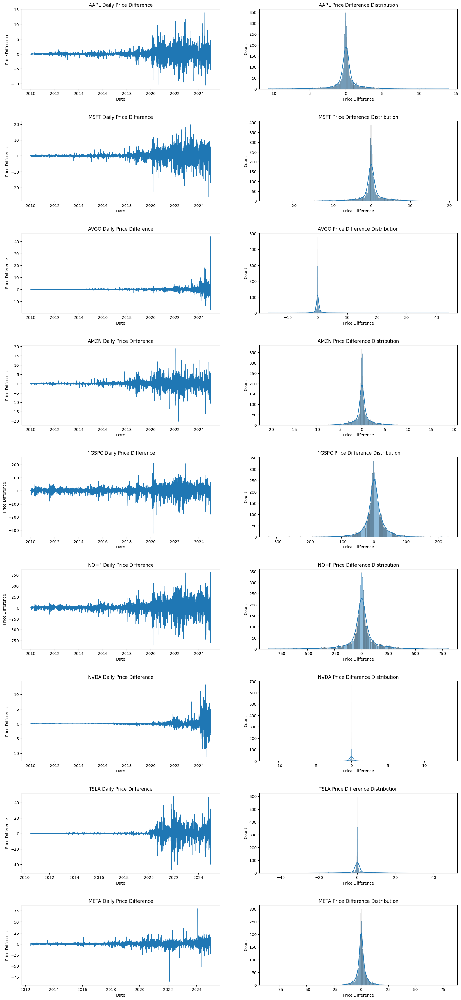

In [232]:
df['daily_price_diff'] = df.groupby('stock_name')['adj_close'].diff()

fig = plt.figure(figsize=(20, len(symbols)*5))
gs = fig.add_gridspec(len(symbols), 2, hspace=0.4)

for i, symbol in enumerate(symbols):
    df_symbol = df[df['stock_name'] == symbol].copy()
    df_symbol.set_index("date", inplace=True)
    
    # Time series plot
    ax1 = fig.add_subplot(gs[i, 0])
    ax1.plot(df_symbol.index, df_symbol['daily_price_diff'])
    ax1.set_title(f'{symbol} Daily Price Difference')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Price Difference')
    
    # Distribution plot
    ax2 = fig.add_subplot(gs[i, 1])
    sns.histplot(data=df_symbol['daily_price_diff'].dropna(), kde=True, ax=ax2)
    ax2.set_title(f'{symbol} Price Difference Distribution')
    ax2.set_xlabel('Price Difference')
    
plt.tight_layout()
plt.show()

## Range and Gap

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\3198589689.py:28: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



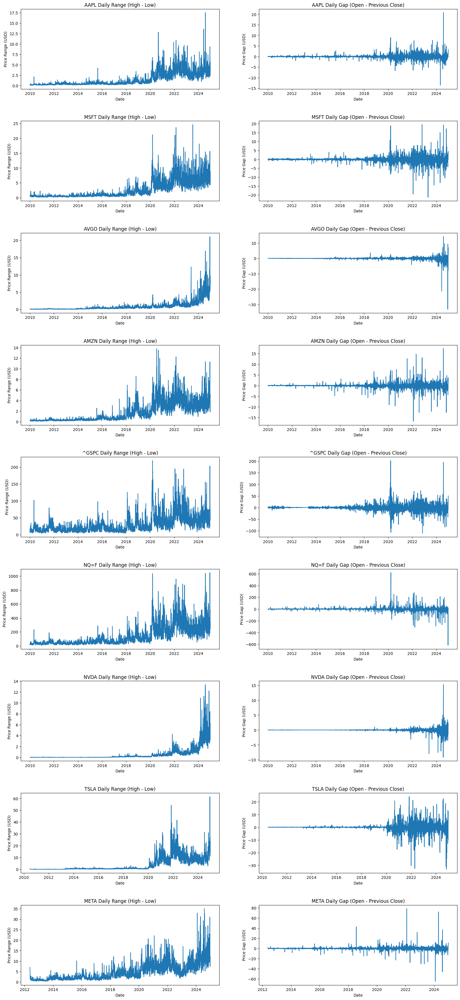

In [233]:
df['range'] = df['high'] - df['low']

# Calculate Gap
df["gap"] = df.groupby("stock_name")["close"].shift() - df["open"]

# Create a figure with subplots for Range and Gap
fig = plt.figure(figsize=(20, len(symbols) * 5))
gs = fig.add_gridspec(len(symbols), 2, hspace=0.4)

for i, symbol in enumerate(symbols):
    df_symbol = df[df['stock_name'] == symbol].copy()
    df_symbol.set_index("date", inplace=True)

    # Range plot
    ax1 = fig.add_subplot(gs[i, 0])
    ax1.plot(df_symbol.index, df_symbol['range'])
    ax1.set_title(f'{symbol} Daily Range (High - Low)')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Price Range (USD)')
    
    # Gap plot
    ax2 = fig.add_subplot(gs[i, 1])
    ax2.plot(df_symbol.index, df_symbol['gap'])
    ax2.set_title(f'{symbol} Daily Gap (Open - Previous Close)')
    ax2.set_xlabel('Date')
    ax2.set_ylabel('Price Gap (USD)')
    
plt.tight_layout()
plt.show()

- The peaks are probably a result of an important event. META(2022) is a result of Tiktok, Metaverse etc.
- As actions must be made based on the next day open price, locating the huge gaps might be beneficial for both our wins and losses.


## Volatility

In [234]:
df = df.reset_index(drop=True)

df["volatility"] = (
    df.groupby("stock_name")["daily_return"]
    .rolling(window=20)
    .std() * np.sqrt(252)
).reset_index(level=0, drop=True)

for symbol in symbols:
    df_symbol = df[df['stock_name'] == symbol].copy()
    df_symbol.set_index("date", inplace=True)

    # Create figure
    fig = go.Figure()
    
    # Add trace
    fig.add_trace(go.Scatter(
        x=df_symbol.index,
        y=df_symbol['volatility'],
        mode='lines',
        name='Volatility'
    ))
    
    # Update layout
    fig.update_layout(
        title=f'Volatility of {symbol} stock',
        xaxis_title='Date',
        yaxis_title='Volatility',
        height=400,
        showlegend=True
    )
    
    fig.show()

- Probably the most important feature after price
- Historical volatility provides insight into past market stability, helping the model recognize periods of higher risk or uncertainty.
- The peak in 2020 is probably related to COVID pandemic. This refers to the uncertainty in market.
- While high volatility incidates greater risk but creates opportunities for short-term strategies, lower volatility refers to stable, consistent growth.
- Volatility could be use as a metric to determine the position size.
- Some peaks(e.g July 2013 META) is a result of earning report. 
- Adding some features extracted from earnings report might be a good idea.

## Volume

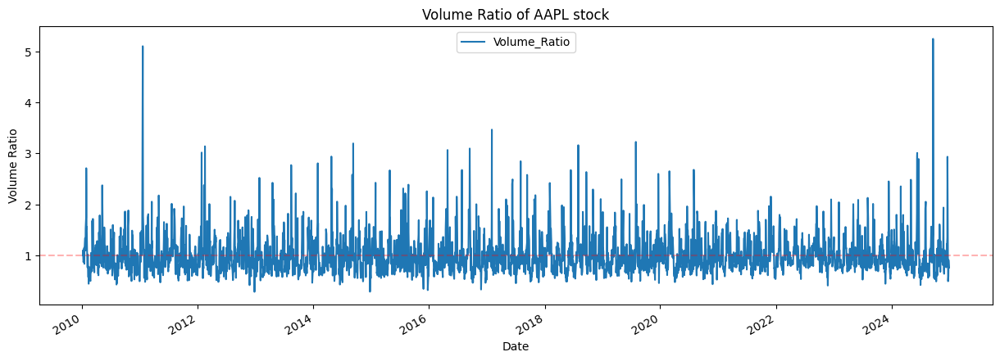

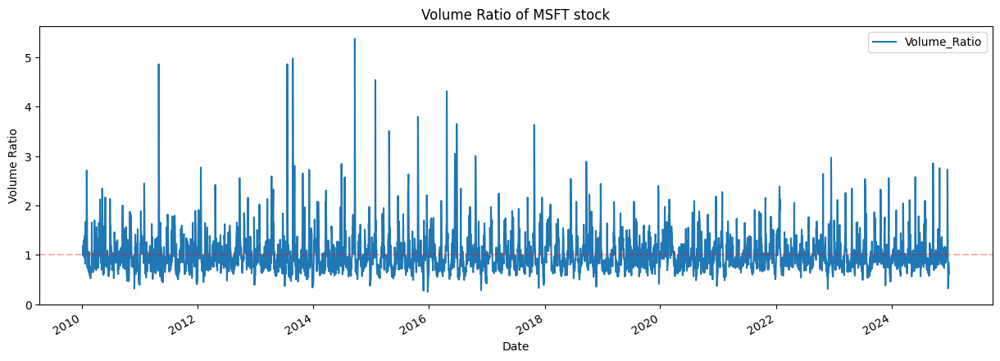

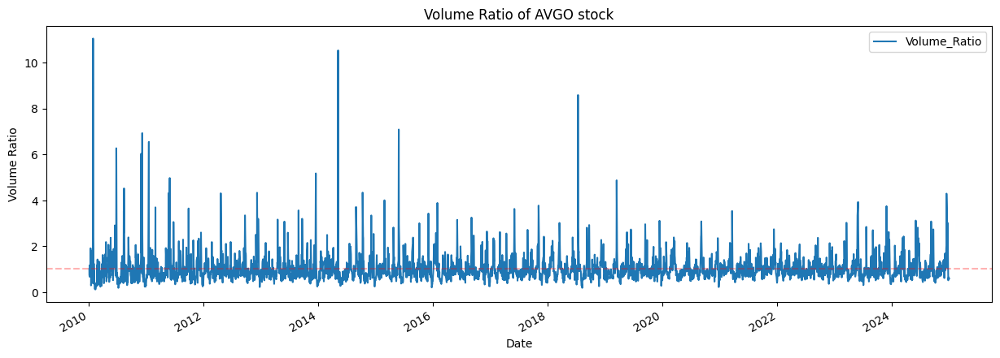

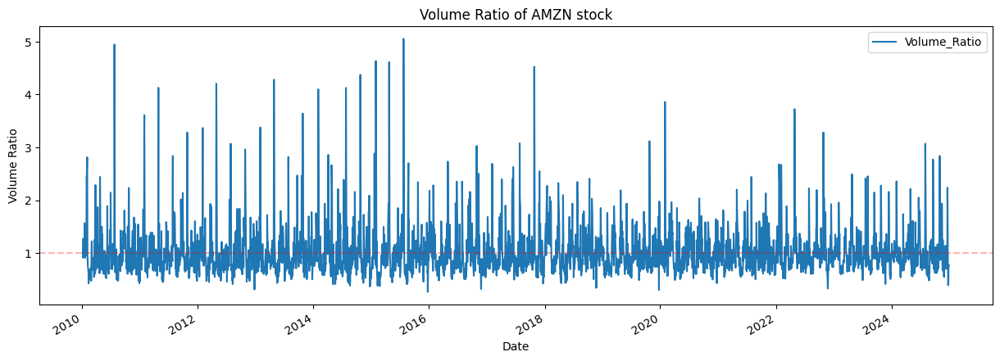

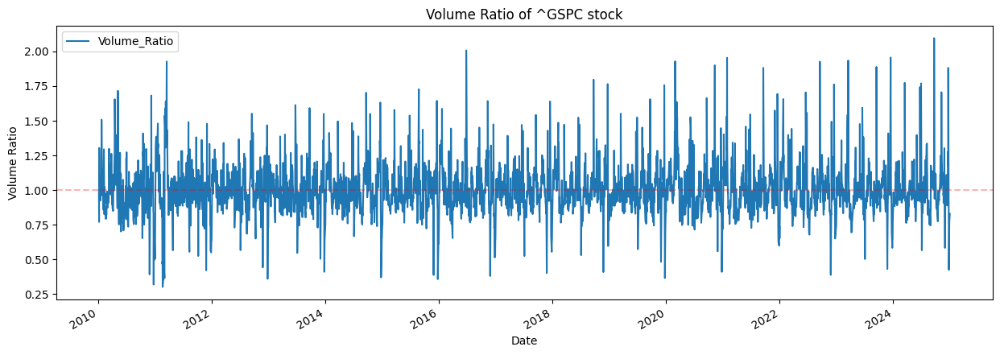

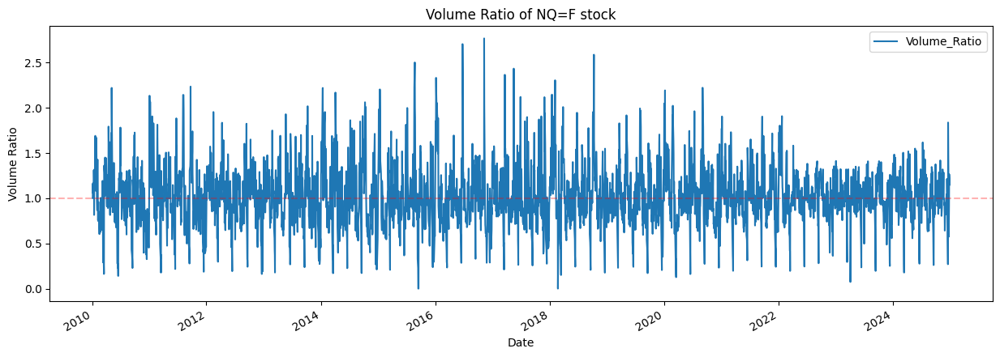

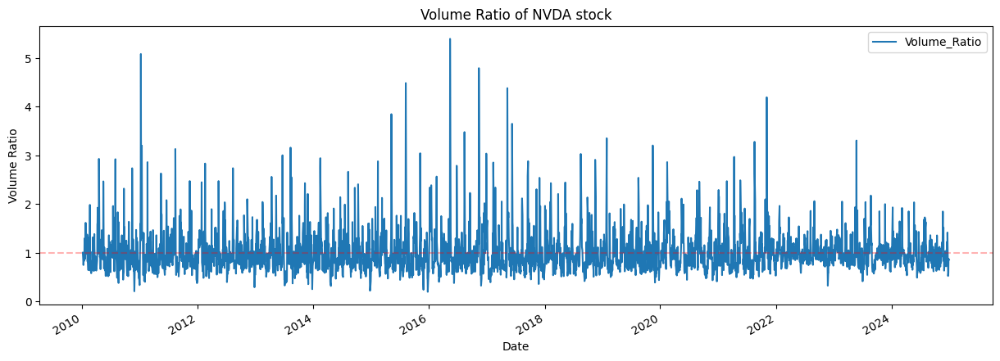

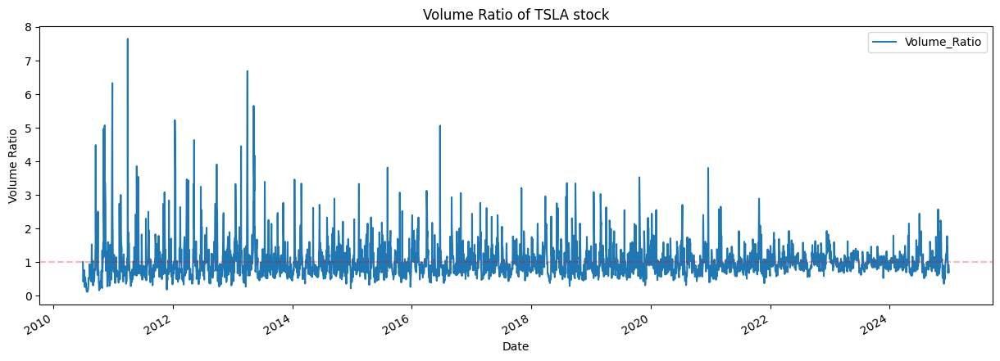

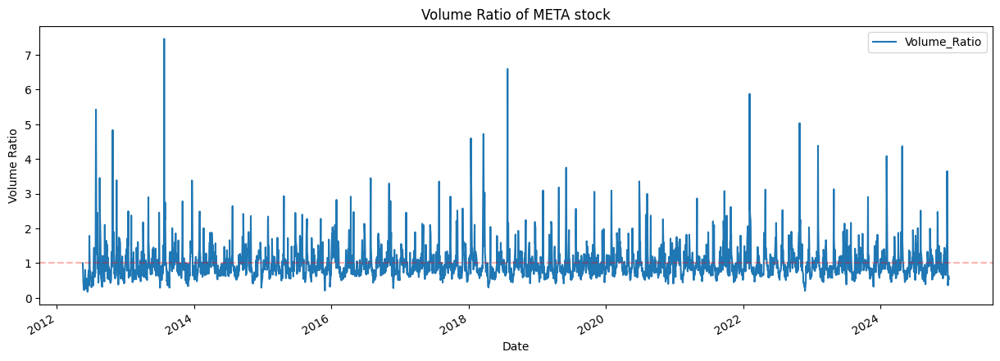

In [235]:
df['Volume_MA'] = (
    df.groupby('stock_name')['volume']
    .transform(lambda x: x.rolling(window=20, min_periods=1).mean())
)

# Calculate Volume Ratio
df['Volume_Ratio'] = df['volume'] / df['Volume_MA']

for symbol in symbols:
    df_symbol = df[df['stock_name'] == symbol].copy()
    df_symbol.set_index("date", inplace=True)
    # Create plot
    plt.figure(figsize=(15, 5))
    df_symbol['Volume_Ratio'].plot(legend=True)
    plt.title(f'Volume Ratio of {symbol} stock')
    plt.xlabel('Date')
    plt.ylabel('Volume Ratio')
    plt.axhline(y=1, color='r', linestyle='--', alpha=0.3)  
    plt.show()

- Highest correlated feature with next_day_return
- Represents the traded shares in that day
- high volume indicates the interest in a security
- volume also confirms the strength the movement of price
- high peaks probably points to the exhaustion of the current trend

## RSI

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\3726990303.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\3726990303.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\3726990303.py:46: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



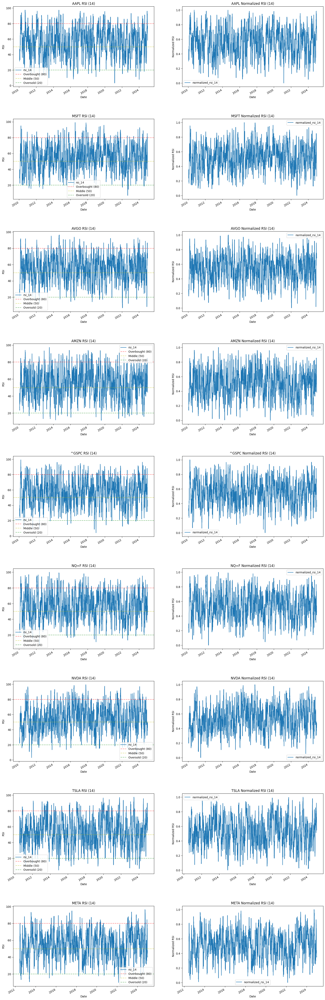

In [236]:
import matplotlib.pyplot as plt
import seaborn as sns

# Normalize RSI to [0, 1]
def normalize_rsi(rsi_series):
    return (rsi_series - rsi_series.min()) / (rsi_series.max() - rsi_series.min())

# Function to calculate RSI
def calculate_rsi(df, period):
    """Calculate Relative Strength Index"""
    delta = df['adj_close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs))

# Calculate RSI and normalized RSI
df['rsi_14'] = df.groupby('stock_name', group_keys=False).apply(lambda x: calculate_rsi(x, 14))
df['normalized_rsi_14'] = df.groupby('stock_name', group_keys=False).apply(lambda x: normalize_rsi(x['rsi_14']))

# Visualization
fig = plt.figure(figsize=(20, len(symbols) * 8))
gs = fig.add_gridspec(len(symbols), 2, hspace=0.4)  # Adjust grid to have 3 columns per row

for i, symbol in enumerate(symbols):
    df_symbol = df[df['stock_name'] == symbol].copy()
    df_symbol.set_index('date', inplace=True)
    
    # RSI 14 Plot
    ax1 = fig.add_subplot(gs[i, 0])
    df_symbol['rsi_14'].plot(ax=ax1, legend=True, title=f'{symbol} RSI (14)')
    ax1.axhline(y=80, color='r', linestyle='--', alpha=0.5, label='Overbought (80)')
    ax1.axhline(y=50, color='y', linestyle='--', alpha=0.5, label='Middle (50)')
    ax1.axhline(y=20, color='g', linestyle='--', alpha=0.5, label='Oversold (20)')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('RSI')
    ax1.legend()

    # Normalized RSI 14 Plot
    ax2 = fig.add_subplot(gs[i, 1])
    df_symbol['normalized_rsi_14'].plot(ax=ax2, legend=True, title=f'{symbol} Normalized RSI (14)')
    ax2.set_xlabel('Date')
    ax2.set_ylabel('Normalized RSI')
    ax2.legend()

plt.tight_layout()
plt.show()


- Measures the speed and change of price movements
- below 30 RSI may point to the oversold.
- above 70 RSI may point to the overbought.
- 20,80 would be less riskier bounds.
- While monitoring rsi can help predict the movement, it doesnt guarantee that price will go op or down in a short time.
- While 50 < rsi < 80 , we can expect to prices go up or follow the uptrend
- While 20 < rsi < 50 , we can expect to prices go down or follow the downtrend 

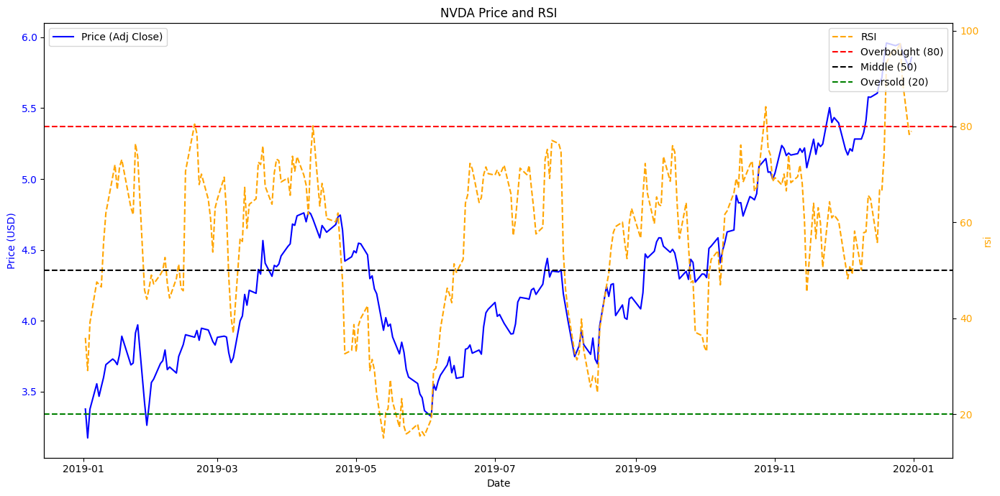

In [237]:
nvda_data = df[df['stock_name'] == 'NVDA'].copy()

nvda_data['date'] = pd.to_datetime(nvda_data['date'])
nvda_data.set_index('date', inplace=True)
nvda_data = nvda_data.loc['2019-01-01':'2020-01-01']

fig, ax1 = plt.subplots(figsize=(14, 7))

ax1.plot(nvda_data.index, nvda_data['adj_close'], color='blue', label='Price (Adj Close)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Price (USD)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title('NVDA Price and RSI')

ax2 = ax1.twinx()
ax2.plot(nvda_data.index, nvda_data['rsi_14'], color='orange', label='RSI', linestyle='--')
ax2.set_ylabel('rsi', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')

ax2.axhline(80, color='red', linestyle='--', label='Overbought (80)')
ax2.axhline(50, color='black', linestyle='--', label='Middle (50)')
ax2.axhline(20, color='green', linestyle='--', label='Oversold (20)')

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

- 50 < rsi > 80 confirms uptrend
- detecting the breakthroughs of rsi might be crucial

## MACD

- MACD is the difference between EMA12 and EMA26
- MACD signal is the EMA9
- When MACD goes above MACD signal it refers to buy, when it goes below it refers to a sell signal
- To investigate we plot NVDA 2019-2020(date is random, same for rsi)


Price Rate of Change (ROC) at Each Crossover:
Crossover on 2019-06-06: ROC = 4.85%
Crossover on 2019-07-31: ROC = -10.63%
Crossover on 2019-09-20: ROC = 3.21%
Crossover on 2019-10-09: ROC = 3.22%
Crossover on 2019-12-12: ROC = 1.88%


C:\Users\deadp\AppData\Local\Temp\ipykernel_4124\3547199060.py:12: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



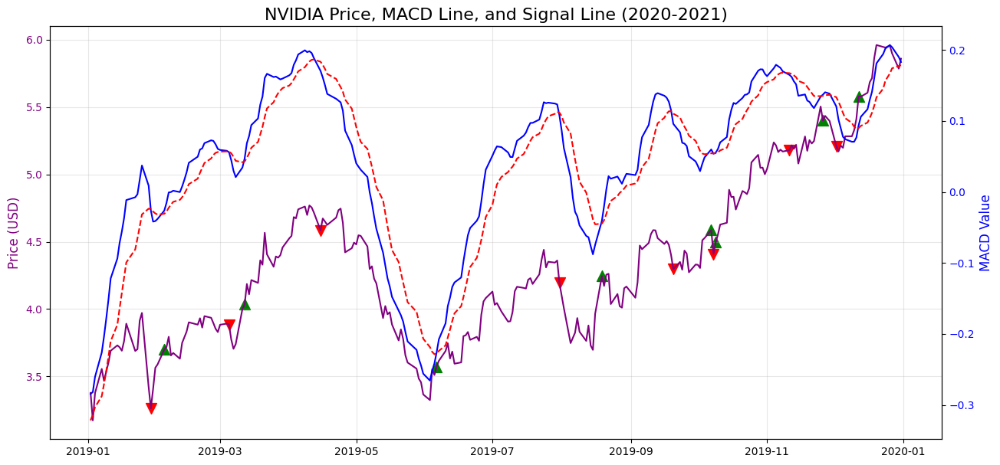

In [238]:
df.set_index('date', inplace=True)

def calculate_macd(df):
    df['EMA_12'] = df['adj_close'].ewm(span=12, adjust=False).mean()
    df['EMA_26'] = df['adj_close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = df['EMA_12'] - df['EMA_26']
    df['Signal_Line'] = df['MACD'].ewm(span=9, adjust=False).mean()
    df['MACD_Histogram'] = df['MACD'] - df['Signal_Line']
    return df

# Apply the MACD calculation to each stock group
df = df.groupby('stock_name', group_keys=False).apply(calculate_macd)

nvda_data = df[(df['stock_name'] == 'NVDA') & (df.index >= '2019-01-01') & (df.index <= '2020-01-01')]

fig, ax1 = plt.subplots(figsize=(15, 7))

# Plot the adjusted closing price on the primary y-axis
ax1.plot(nvda_data.index, nvda_data['adj_close'], label='Price (Adj Close)', color='purple')
ax1.set_ylabel('Price (USD)', fontsize=12, color='purple')
ax1.tick_params(axis='y', labelcolor='purple')

# Plot MACD and Signal Line on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(nvda_data.index, nvda_data['MACD'], label='MACD Line', color='blue')
ax2.plot(nvda_data.index, nvda_data['Signal_Line'], label='Signal Line', color='red', linestyle='--')
ax2.set_ylabel('MACD Value', fontsize=12, color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Identify Bullish and Bearish Crossovers
bullish_crosses = nvda_data[(nvda_data['MACD'] > nvda_data['Signal_Line']) & 
                            (nvda_data['MACD'].shift(1) <= nvda_data['Signal_Line'].shift(1))]
bearish_crosses = nvda_data[(nvda_data['MACD'] < nvda_data['Signal_Line']) & 
                            (nvda_data['MACD'].shift(1) >= nvda_data['Signal_Line'].shift(1))]

# Annotate Bullish Crossovers
for idx in bullish_crosses.index:
    price = nvda_data.loc[idx, 'adj_close']
    ax1.scatter(idx, price, color='green', label='Bullish Crossover' if 'Bullish Crossover' not in plt.gca().get_legend_handles_labels()[1] else "", marker='^', s=100)

# Annotate Bearish Crossovers
for idx in bearish_crosses.index:
    price = nvda_data.loc[idx, 'adj_close']
    ax1.scatter(idx, price, color='red', label='Bearish Crossover' if 'Bearish Crossover' not in plt.gca().get_legend_handles_labels()[1] else "", marker='v', s=100)

# Calculate and Print ROC for Crossovers
print("\nPrice Rate of Change (ROC) at Each Crossover:")
for idx in bullish_crosses.index.union(bearish_crosses.index):
    future_idx = idx + pd.Timedelta(days=5)  # Add 5 days using pd.Timedelta
    if future_idx in nvda_data.index:  # Ensure future index exists
        current_price = nvda_data.loc[idx, 'adj_close']
        future_price = nvda_data.loc[future_idx, 'adj_close']
        roc = ((future_price - current_price) / current_price) * 100
        print(f"Crossover on {idx.date()}: ROC = {roc:.2f}%")

# Add title and legend
ax1.set_title('NVIDIA Price, MACD Line, and Signal Line (2020-2021)', fontsize=16)
ax1.grid(alpha=0.3)

# Show the plot
plt.show()

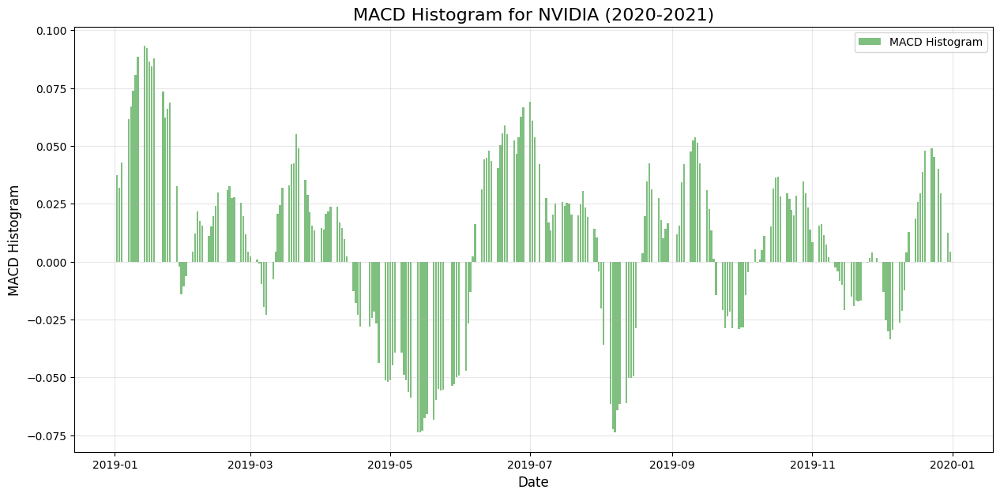

In [239]:
plt.figure(figsize=(15, 7))

plt.bar(nvda_data.index, nvda_data['MACD_Histogram'], label='MACD Histogram', color='green', alpha=0.5)

plt.title('MACD Histogram for NVIDIA (2020-2021)', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('MACD Histogram', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)

plt.show()

- Peak of the hills have decreased in january to april, points to exhaustion of the trend and bearish trend follows

## EMA

- Exponential moving averages
- Crosses between them may give signal

ROC Between Crossovers:
  current_date  next_date        roc
0   2019-01-11 2019-01-29 -11.576961
1   2019-01-29 2019-02-05  13.943745
2   2019-02-05 2019-03-07  -0.357566
3   2019-03-07 2019-03-11   7.959290
4   2019-03-11 2019-04-29  11.288297
5   2019-04-29 2019-06-19 -14.518054
6   2019-06-19 2019-08-02   5.270395
7   2019-08-02 2019-08-20   4.144195
8   2019-08-20 2019-09-30   3.795958
9   2019-09-30 2019-10-03   4.159233


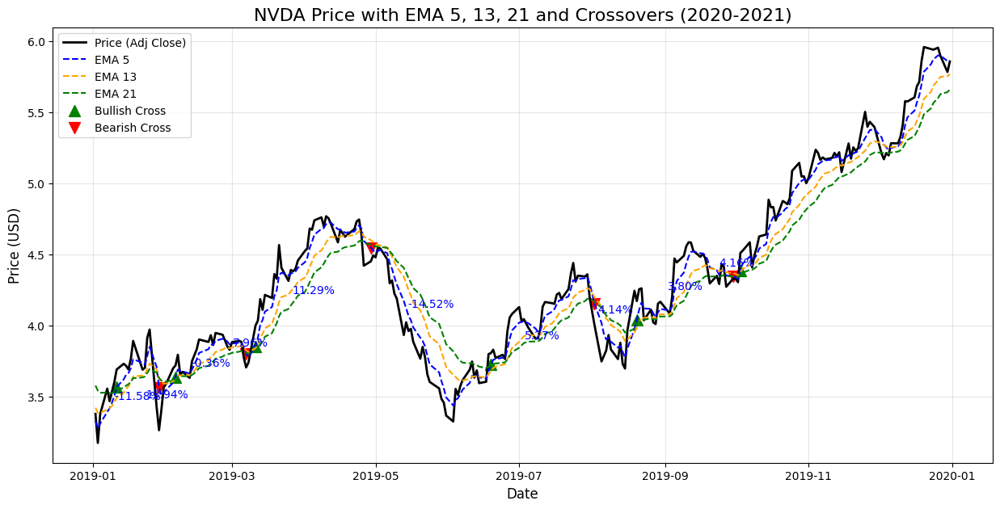

In [240]:
df['EMA_5'] = df.groupby('stock_name')['adj_close'].transform(lambda x: x.ewm(span=5, adjust=False).mean())
df['EMA_13'] = df.groupby('stock_name')['adj_close'].transform(lambda x: x.ewm(span=13, adjust=False).mean())
df['EMA_21'] = df.groupby('stock_name')['adj_close'].transform(lambda x: x.ewm(span=21, adjust=False).mean())
nvda_data = df[(df['stock_name'] == 'NVDA') & (df.index >= '2019-01-01') & (df.index <= '2020-01-01')].copy()

# Identify Bullish and Bearish Crossovers
bullish_crosses = nvda_data[(nvda_data['EMA_5'] > nvda_data['EMA_21']) & 
                            (nvda_data['EMA_5'].shift(1) <= nvda_data['EMA_21'].shift(1))]
bearish_crosses = nvda_data[(nvda_data['EMA_5'] < nvda_data['EMA_21']) & 
                            (nvda_data['EMA_5'].shift(1) >= nvda_data['EMA_21'].shift(1))]

all_crosses = pd.concat([bullish_crosses, bearish_crosses]).sort_index()

rocs = []
for i in range(len(all_crosses) - 1):
    current_price = all_crosses.iloc[i]['adj_close']
    next_price = all_crosses.iloc[i + 1]['adj_close']
    roc = ((next_price - current_price) / current_price) * 100
    rocs.append({
        'current_date': all_crosses.index[i],
        'next_date': all_crosses.index[i + 1],
        'roc': roc
    })

roc_df = pd.DataFrame(rocs)

print("ROC Between Crossovers:")
print(roc_df)

plt.figure(figsize=(15, 7))

plt.plot(nvda_data.index, nvda_data['adj_close'], label='Price (Adj Close)', color='black', linewidth=2)

# Plot EMAs
plt.plot(nvda_data.index, nvda_data['EMA_5'], label='EMA 5', color='blue', linestyle='--')
plt.plot(nvda_data.index, nvda_data['EMA_13'], label='EMA 13', color='orange', linestyle='--')
plt.plot(nvda_data.index, nvda_data['EMA_21'], label='EMA 21', color='green', linestyle='--')

plt.scatter(bullish_crosses.index, bullish_crosses['EMA_5'], color='green', label='Bullish Cross', marker='^', s=100)

plt.scatter(bearish_crosses.index, bearish_crosses['EMA_5'], color='red', label='Bearish Cross', marker='v', s=100)

for i in range(len(roc_df)):
    current_date = roc_df.iloc[i]['current_date']
    next_date = roc_df.iloc[i]['next_date']
    roc_value = roc_df.iloc[i]['roc']
    mid_date = current_date + (next_date - current_date) / 2  # Midpoint for annotation
    mid_price = (nvda_data.loc[current_date, 'adj_close'] + nvda_data.loc[next_date, 'adj_close']) / 2
    plt.text(mid_date, mid_price, f'{roc_value:.2f}%', fontsize=10, color='blue', ha='center')

plt.title('NVDA Price with EMA 5, 13, 21 and Crossovers (2020-2021)', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Price (USD)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)

plt.show()

## Correlations
- To observe potential targets we generate next_day_return and next_week_return

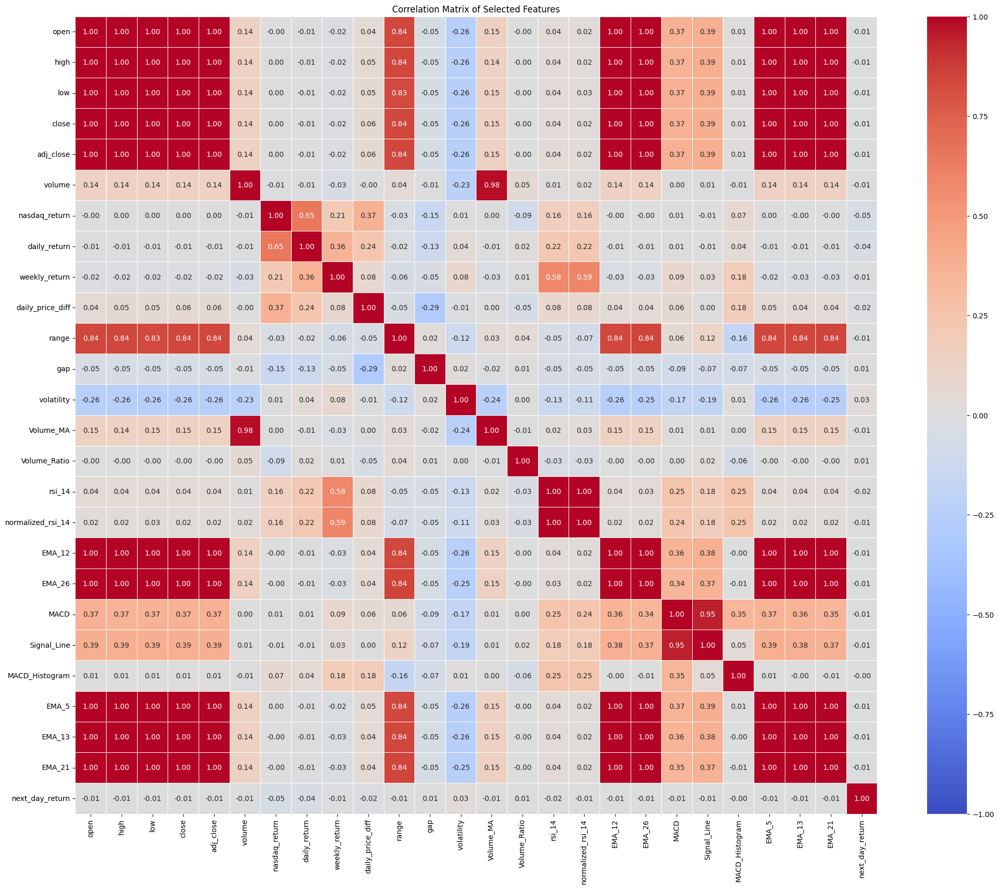

In [241]:
df['next_day_return'] = df.groupby('stock_name')['daily_return'].shift(-1)
df['weekly_return'] = df.groupby('stock_name')['adj_close'].pct_change(7)
corr_matrix = df.corr(numeric_only=True)

plt.figure(figsize=(25, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, linewidths=0.5)
plt.title("Correlation Matrix of Selected Features")
plt.show()

- While we get some correlations on next_week_return, next_day_return does not show any signal

In [242]:
# generate features for weekly_df
weekly_df = weekly_df.sort_values(['stock_name', 'Date'])
grouped = weekly_df.groupby('stock_name')

weekly_df['weekly_price_diff'] = grouped['adj_close'].transform(lambda x: x - grouped['open'].transform('first'))

weekly_df['range'] = grouped['high'].transform('max') - grouped['low'].transform('min')

weekly_df['gap'] = grouped['open'].diff()

weekly_df['volatility'] = (grouped['high'].transform('max') - grouped['low'].transform('min')) / grouped['open'].transform('first')

weekly_df['volume_ma'] = grouped['volume'].transform(lambda x: x.rolling(window=4, min_periods=1).mean())

weekly_df['volume_ratio'] = weekly_df['volume'] / weekly_df['volume_ma']

def calculate_rsi(series, period=14):
    delta = series.diff()
    gain = np.maximum(delta, 0)
    loss = np.abs(np.minimum(delta, 0))
    avg_gain = gain.rolling(window=period, min_periods=1).mean()
    avg_loss = loss.rolling(window=period, min_periods=1).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

weekly_df['rsi_14'] = grouped['adj_close'].transform(lambda x: calculate_rsi(x, period=14))

weekly_df['normalized_rsi_14'] = (weekly_df['rsi_14'] - 30) / (70 - 30)

weekly_df['ema12'] = grouped['adj_close'].transform(lambda x: x.ewm(span=12, adjust=False).mean())
weekly_df['ema26'] = grouped['adj_close'].transform(lambda x: x.ewm(span=26, adjust=False).mean())
weekly_df['macd'] = weekly_df['ema12'] - weekly_df['ema26']

weekly_df['ema5'] = grouped['adj_close'].transform(lambda x: x.ewm(span=5, adjust=False).mean())
weekly_df['ema13'] = grouped['adj_close'].transform(lambda x: x.ewm(span=13, adjust=False).mean())
weekly_df['ema21'] = grouped['adj_close'].transform(lambda x: x.ewm(span=21, adjust=False).mean())

weekly_df.head()

,Date,stock_name,open,high,low,close,adj_close,volume,weekly_return,weekly_price_diff,...,volume_ma,volume_ratio,rsi_14,normalized_rsi_14,ema12,ema26,macd,ema5,ema13,ema21
0,2010-01-10,AAPL,7.622500,7.699643,7.466071,7.570714,6.386256,2572536400,NaN,-1.236244,...,2.572536e+09,1.000000,NaN,NaN,6.386256,6.386256,0.000000,6.386256,6.386256,6.386256
1,2010-01-17,AAPL,7.600000,7.607143,7.289286,7.354643,6.203989,2689542800,-0.028541,-1.418511,...,2.631040e+09,1.022236,0.000000,-0.750000,6.358215,6.372754,-0.014540,6.325500,6.360218,6.369686
2,2010-01-24,AAPL,7.440357,7.698214,7.041429,7.062500,5.957552,2832082400,-0.039722,-1.664948,...,2.698054e+09,1.049676,0.000000,-0.750000,6.296574,6.341999,-0.045424,6.202851,6.302694,6.332219
3,2010-01-31,AAPL,7.232500,7.632500,6.794643,6.859286,5.786133,7074832800,-0.028773,-1.836367,...,3.792249e+09,1.865604,0.000000,-0.750000,6.218045,6.300824,-0.082779,6.063945,6.228900,6.282575
4,2010-02-07,AAPL,6.870357,7.150000,6.816071,6.980714,5.888562,3671505600,0.017702,-1.733938,...,4.066991e+09,0.902757,14.579562,-0.385511,6.167355,6.270286,-0.102930,6.005484,6.180280,6.246756


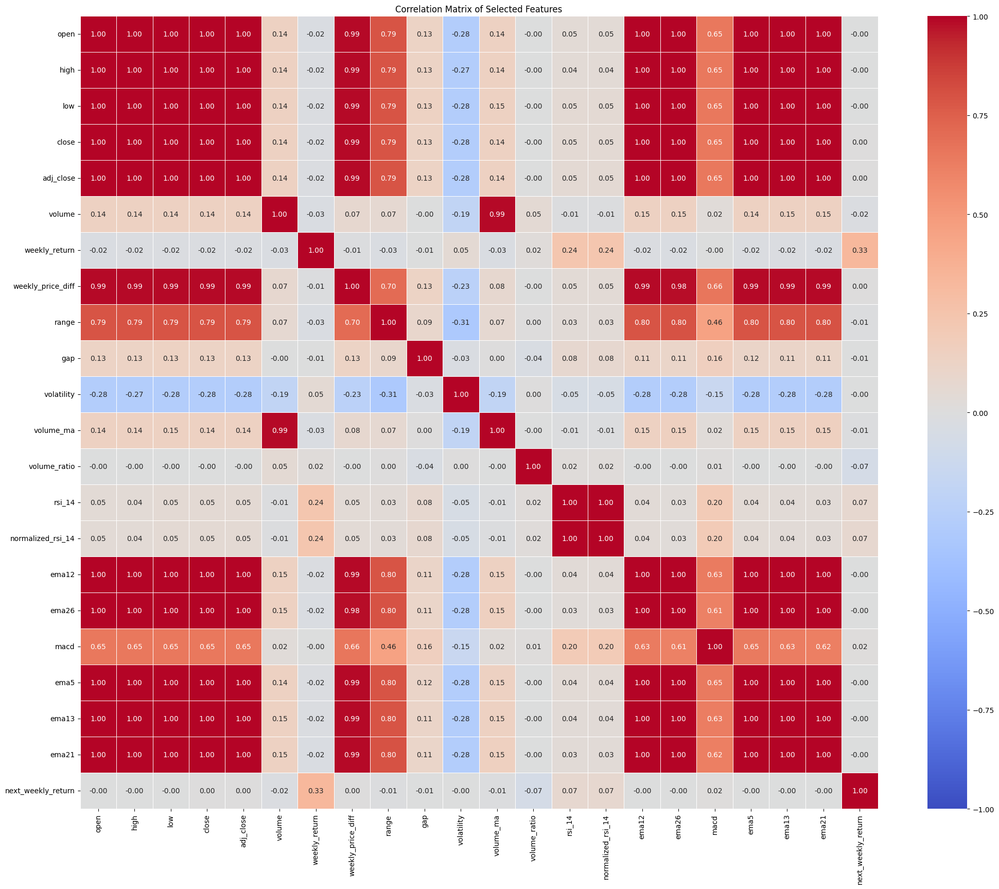

In [243]:
weekly_df = weekly_df.sort_values(by='Date')
weekly_df['weekly_return'] = weekly_df.groupby('stock_name')['adj_close'].pct_change()
weekly_df['next_weekly_return'] = weekly_df['weekly_return'].shift(-1)

corr_matrix = weekly_df.corr(numeric_only=True)

plt.figure(figsize=(25, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, linewidths=0.5)
plt.title("Correlation Matrix of Selected Features")
plt.show()

- Since in weekly data, we have better signal/noise ratio and better correlations, prediction will be based on next week return

# Quick EDA with Weekly Data/Next Week Return

## Weekly return vs Next Week Return

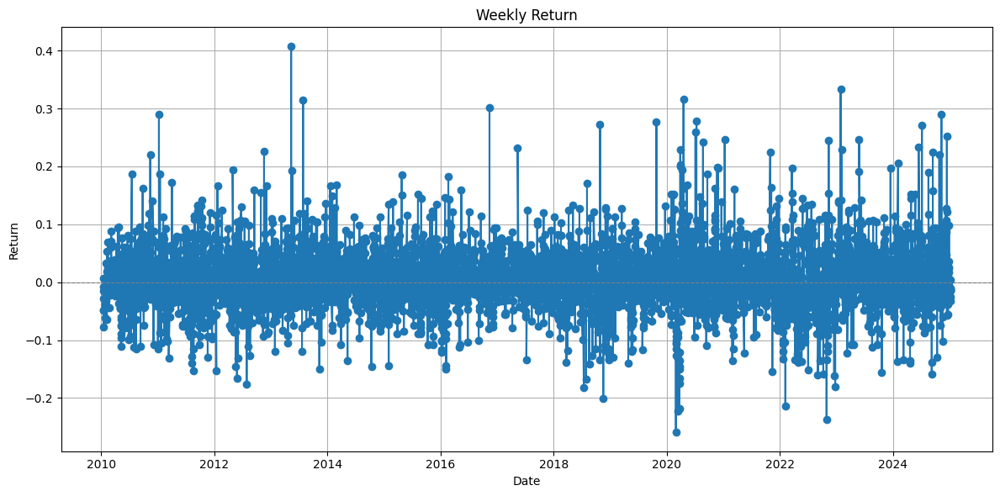

In [244]:
plt.figure(figsize=(12, 6))
plt.plot(weekly_df["Date"], weekly_df["weekly_return"], label="Weekly Return", marker="o")

plt.title("Weekly Return")
plt.xlabel("Date")
plt.ylabel("Return")
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)  
plt.grid(True)
plt.tight_layout()


plt.show()

In [245]:
weekly_df[['Date', 'weekly_return', 'next_weekly_return']].tail(10)

,Date,weekly_return,next_weekly_return
3790,2024-12-29,-0.013903,0.003503
5357,2025-01-05,0.003503,-0.033012
6115,2025-01-05,-0.033012,-0.010950
1565,2025-01-05,-0.010950,-0.013240
3791,2025-01-05,-0.013240,-0.025522
2348,2025-01-05,-0.025522,-0.013008
4574,2025-01-05,-0.013008,-0.014288
3008,2025-01-05,-0.014288,-0.013263
782,2025-01-05,-0.013263,-0.010702
6898,2025-01-05,-0.010702,NaN


## RSI

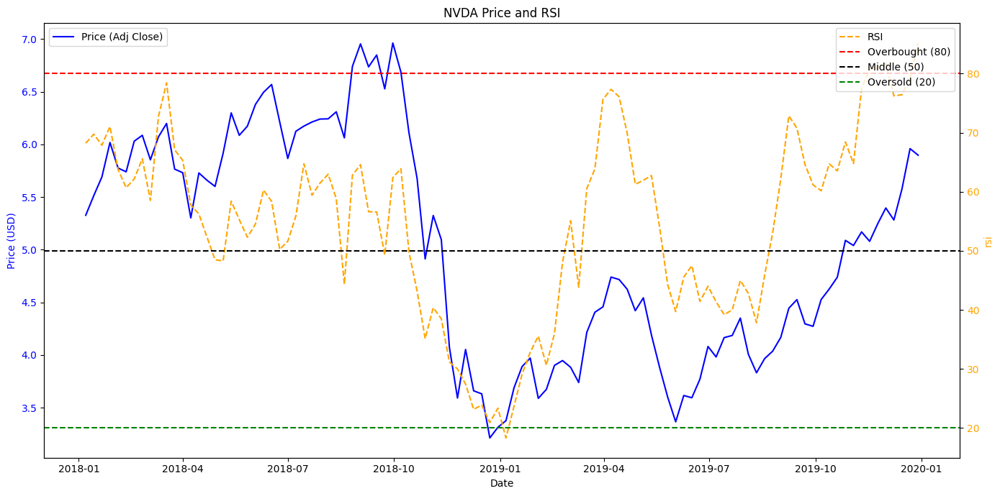

In [246]:
nvda_data = weekly_df[weekly_df['stock_name'] == 'NVDA'].copy()

nvda_data['Date'] = pd.to_datetime(nvda_data['Date'])
nvda_data.set_index('Date', inplace=True)
nvda_data = nvda_data.loc['2018-01-01':'2020-01-01']

fig, ax1 = plt.subplots(figsize=(14, 7))

ax1.plot(nvda_data.index, nvda_data['adj_close'], color='blue', label='Price (Adj Close)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Price (USD)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title('NVDA Price and RSI')

ax2 = ax1.twinx()
ax2.plot(nvda_data.index, nvda_data['rsi_14'], color='orange', label='RSI', linestyle='--')
ax2.set_ylabel('rsi', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')

ax2.axhline(80, color='red', linestyle='--', label='Overbought (80)')
ax2.axhline(50, color='black', linestyle='--', label='Middle (50)')
ax2.axhline(20, color='green', linestyle='--', label='Oversold (20)')

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

- Momentum of RSI could be a good predictor 

ROC Between Crossovers:
  current_date  next_date        roc
0   2018-04-29 2018-05-06   5.624541
1   2018-05-06 2018-10-21  -4.025308
2   2018-10-21 2019-03-24 -22.389143
3   2019-03-24 2019-05-19 -11.814105
4   2019-05-19 2019-07-14   7.200747
5   2019-07-14 2019-08-11  -8.012638
6   2019-08-11 2019-09-01   8.753269


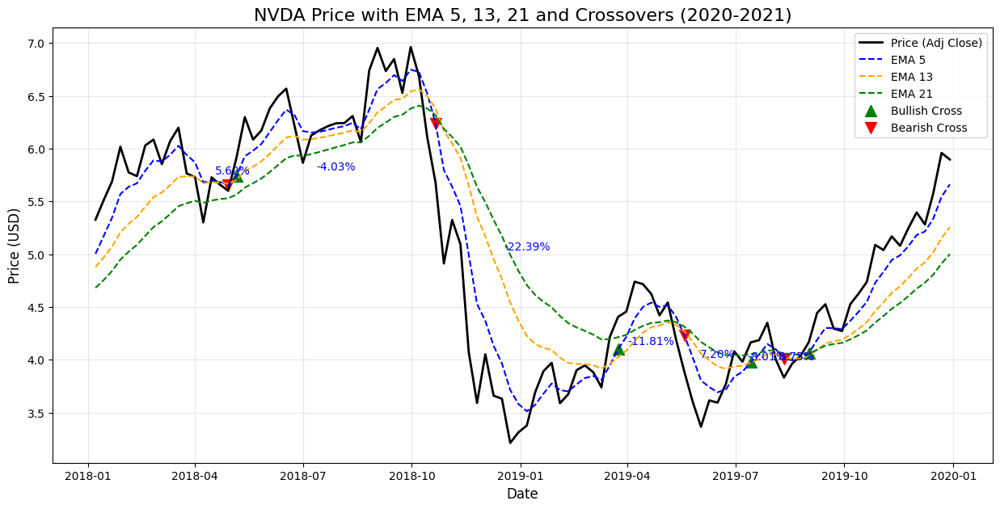

In [247]:
# Identify Bullish and Bearish Crossovers
bullish_crosses = nvda_data[(nvda_data['ema5'] > nvda_data['ema13']) & 
                            (nvda_data['ema5'].shift(1) <= nvda_data['ema13'].shift(1))]
bearish_crosses = nvda_data[(nvda_data['ema5'] < nvda_data['ema13']) & 
                            (nvda_data['ema5'].shift(1) >= nvda_data['ema13'].shift(1))]

all_crosses = pd.concat([bullish_crosses, bearish_crosses]).sort_index()

rocs = []
for i in range(len(all_crosses) - 1):
    current_price = all_crosses.iloc[i]['adj_close']
    next_price = all_crosses.iloc[i + 1]['adj_close']
    roc = ((next_price - current_price) / current_price) * 100
    rocs.append({
        'current_date': all_crosses.index[i],
        'next_date': all_crosses.index[i + 1],
        'roc': roc
    })

roc_df = pd.DataFrame(rocs)

print("ROC Between Crossovers:")
print(roc_df)

plt.figure(figsize=(15, 7))

plt.plot(nvda_data.index, nvda_data['adj_close'], label='Price (Adj Close)', color='black', linewidth=2)

# Plot EMAs
plt.plot(nvda_data.index, nvda_data['ema5'], label='EMA 5', color='blue', linestyle='--')
plt.plot(nvda_data.index, nvda_data['ema13'], label='EMA 13', color='orange', linestyle='--')
plt.plot(nvda_data.index, nvda_data['ema21'], label='EMA 21', color='green', linestyle='--')

plt.scatter(bullish_crosses.index, bullish_crosses['ema5'], color='green', label='Bullish Cross', marker='^', s=100)

plt.scatter(bearish_crosses.index, bearish_crosses['ema5'], color='red', label='Bearish Cross', marker='v', s=100)

for i in range(len(roc_df)):
    current_date = roc_df.iloc[i]['current_date']
    next_date = roc_df.iloc[i]['next_date']
    roc_value = roc_df.iloc[i]['roc']
    mid_date = current_date + (next_date - current_date) / 2  # Midpoint for annotation
    mid_price = (nvda_data.loc[current_date, 'adj_close'] + nvda_data.loc[next_date, 'adj_close']) / 2
    plt.text(mid_date, mid_price, f'{roc_value:.2f}%', fontsize=10, color='blue', ha='center')

plt.title('NVDA Price with EMA 5, 13, 21 and Crossovers (2020-2021)', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Price (USD)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)

plt.show()

## Stochastic Oscillator

In [248]:
def calculate_stochastic(df, k_period=14, d_period=3):
    # Calculate %K
    df['Low_K'] = df['adj_close'].rolling(window=k_period).min()
    df['High_K'] = df['adj_close'].rolling(window=k_period).max()
    df['Stoch_%K'] = 100 * ((df['adj_close'] - df['Low_K']) / (df['High_K'] - df['Low_K']))
    
    # Calculate %D (Moving Average of %K)
    df['Stoch_%D'] = df['Stoch_%K'].rolling(window=d_period).mean()
    
    # Drop intermediate columns
    df.drop(['Low_K', 'High_K'], axis=1, inplace=True)
    return df

# Calculate the distance between %K and %D
def calculate_k_d_distance(df):
    df['Stochastic_K_D_Distance'] = df['Stoch_%K'] - df['Stoch_%D']
    return df

weekly_df = calculate_stochastic(weekly_df)
weekly_df = calculate_k_d_distance(weekly_df)

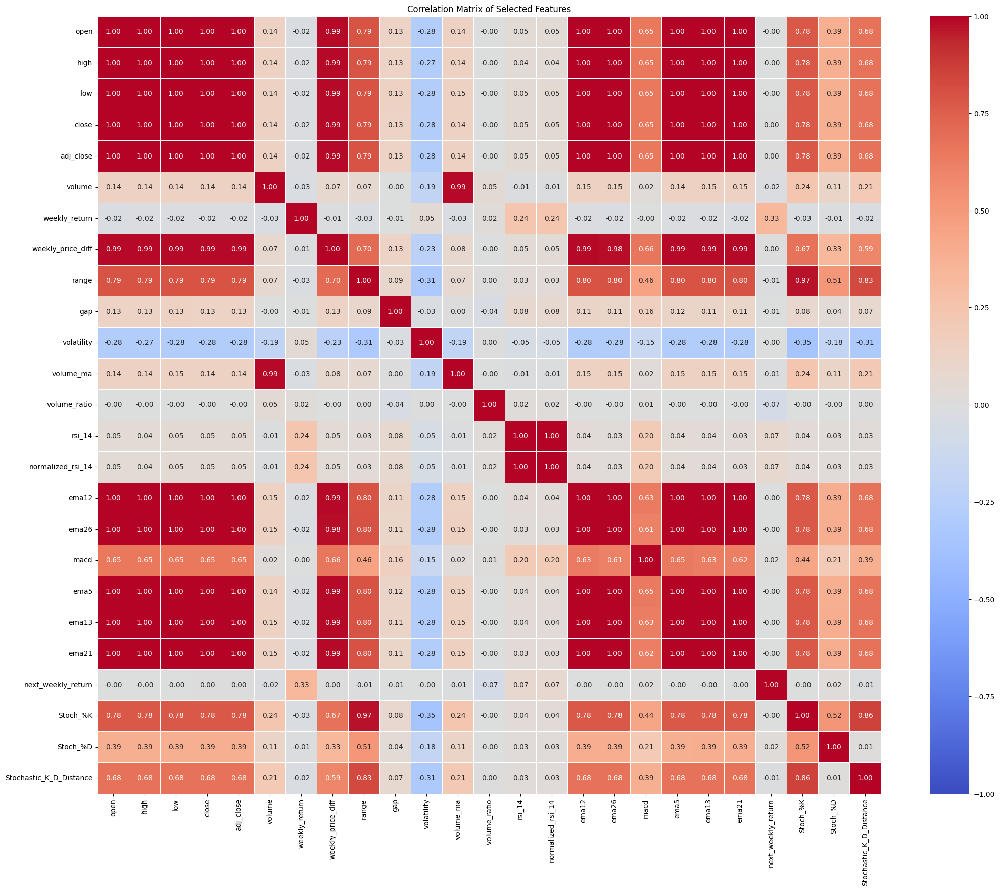

In [249]:
corr_matrix = weekly_df.corr(numeric_only=True)

plt.figure(figsize=(25, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, linewidths=0.5)
plt.title("Correlation Matrix of Selected Features")
plt.show()

In [250]:
import statsmodels.tsa.stattools as sts

#sts.adfuller(weekly_df.next_weekly_return)

In [251]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(weekly_df['next_weekly_return'].dropna())
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -19.091527150332755
p-value: 0.0
